# YOLO Object Detection

In [ ]:
!pip install torch torchvision ultralytics opencv-python matplotlib requests

import torch
import cv2
import numpy as np
from ultralytics import YOLO
import matplotlib.pyplot as plt
import os
import requests
import random

## Download Random COCO Images

In [ ]:
import os
import requests
import random

def download_coco_images(num_images=5):
    if not os.path.exists('data'):
        os.makedirs('data')
    
    base_url = "http://images.cocodataset.org/val2017/"
    image_paths = []
    
    # List of some valid COCO image IDs (you may need to update this list periodically)
    valid_ids = [
    "000000039769", "000000284986", "000000131038", "000000318219", "000000554625",
    "000000092383", "000000549236", "000000550890", "000000579321", "000000581615",
    "000000583331", "000000556501", "000000577985", "000000579608", "000000391895",
    "000000319022", "000000533005", "000000498120", "000000421168", "000000441063",
    "000000007089", "000000037777", "000000252219", "000000087038", "000000174482",
    "000000397133", "000000118113", "000000458752", "000000123850", "000000224477",
    "000000000724", "000000000776", "000000000785", "000000000802", "000000000872",
    "000000000885", "000000000949", "000000001584", "000000001675", "000000001761",
    "000000002006", "000000002149", "000000002153", "000000002327", "000000002912",
    "000000003156", "000000003210", "000000003366", "000000003504", "000000003588"
]
    
    random.shuffle(valid_ids)
    
    for image_id in valid_ids:
        if len(image_paths) >= num_images:
            break
        
        image_url = base_url + f"{image_id}.jpg"
        
        try:
            response = requests.get(image_url, timeout=10)
            response.raise_for_status()
            
            file_path = os.path.join('data', f"{image_id}.jpg")
            with open(file_path, 'wb') as f:
                f.write(response.content)
            image_paths.append(file_path)
            print(f"Successfully downloaded image {image_id}")
        except requests.exceptions.RequestException as e:
            print(f"Failed to download image {image_id}: {str(e)}")
    
    return image_paths

image_paths = download_coco_images(10)
print(f"Downloaded {len(image_paths)} images to the 'data' folder.")

## Load Pre-trained YOLO Model

In [21]:
model = YOLO('yolov5s.pt')
print("Model loaded successfully.")

PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.

Model loaded successfully.


## Define Object Detection Function

In [22]:
def detect_objects(image_path):
    # Read the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Perform detection
    results = model(img)

    # Plot the results
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.imshow(img)

    for result in results:
        boxes = result.boxes.xyxy.cpu().numpy()
        classes = result.boxes.cls.cpu().numpy()
        confidences = result.boxes.conf.cpu().numpy()

        for box, cls, conf in zip(boxes, classes, confidences):
            x1, y1, x2, y2 = box
            label = f"{model.names[int(cls)]} {conf:.2f}"
            
            rect = plt.Rectangle((x1, y1), x2-x1, y2-y1, fill=False, edgecolor='red', linewidth=2)
            ax.add_patch(rect)
            ax.text(x1, y1, label, color='white', fontweight='bold', 
                    bbox=dict(facecolor='red', edgecolor='none', alpha=0.7))

    plt.axis('off')
    plt.tight_layout()
    plt.show()

## Perform Object Detection on Downloaded Images

Detecting objects in data/000000581615.jpg

0: 640x480 1 toilet, 369.6ms
Speed: 2.0ms preprocess, 369.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


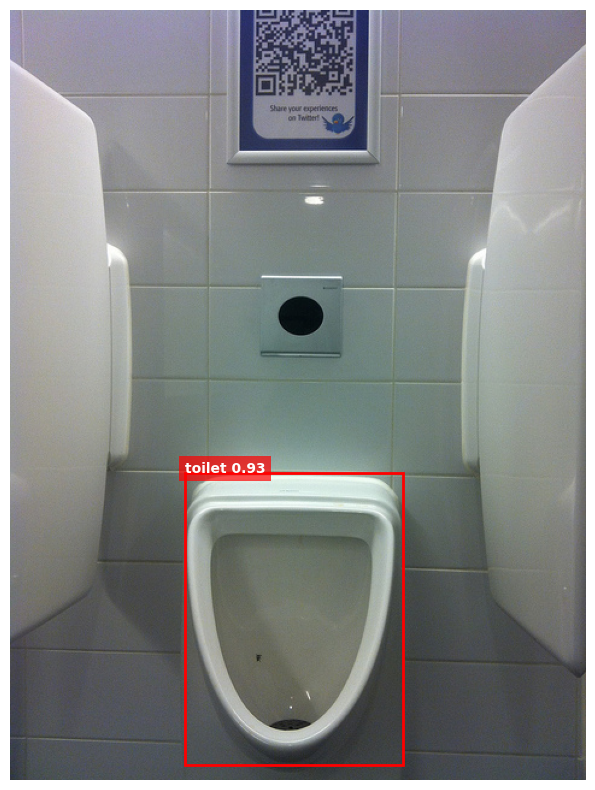



Detecting objects in data/000000000724.jpg

0: 640x480 1 car, 1 truck, 2 stop signs, 376.8ms
Speed: 2.9ms preprocess, 376.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


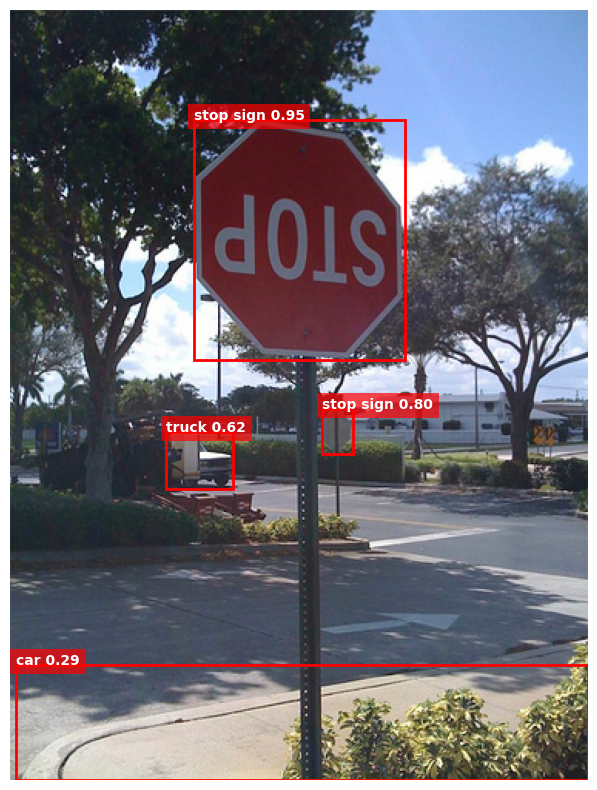



Detecting objects in data/000000000776.jpg

0: 640x448 3 teddy bears, 353.3ms
Speed: 1.8ms preprocess, 353.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)


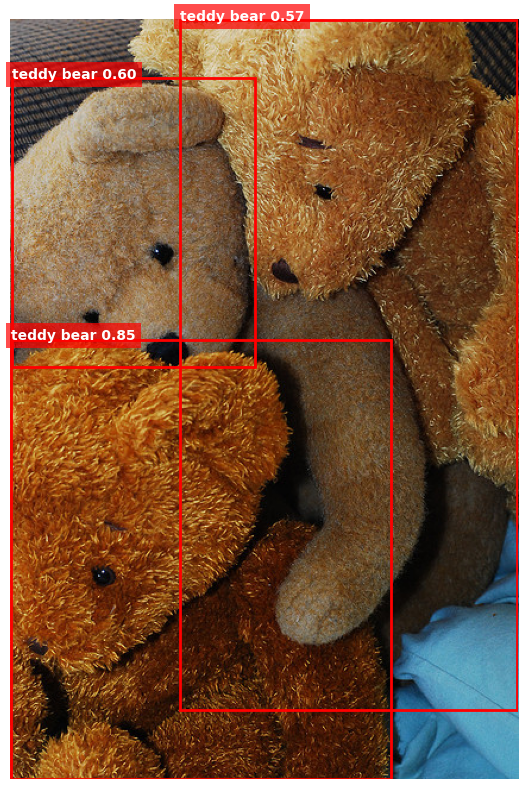



Detecting objects in data/000000000885.jpg

0: 448x640 3 persons, 1 sports ball, 1 tennis racket, 347.7ms
Speed: 2.3ms preprocess, 347.7ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)


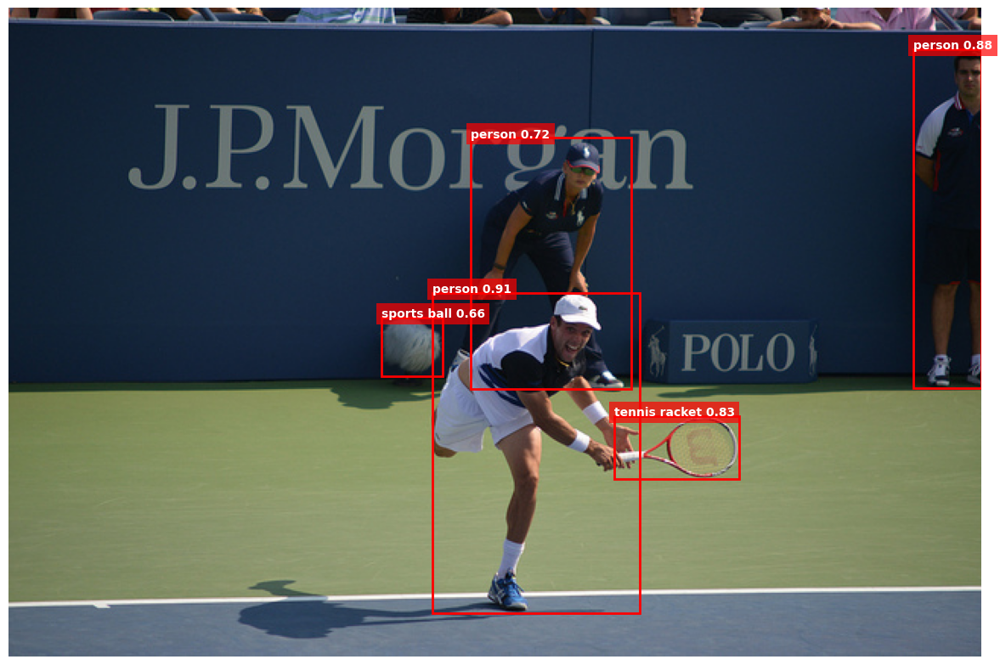



Detecting objects in data/000000252219.jpg

0: 448x640 3 persons, 1 traffic light, 1 umbrella, 329.3ms
Speed: 2.1ms preprocess, 329.3ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)


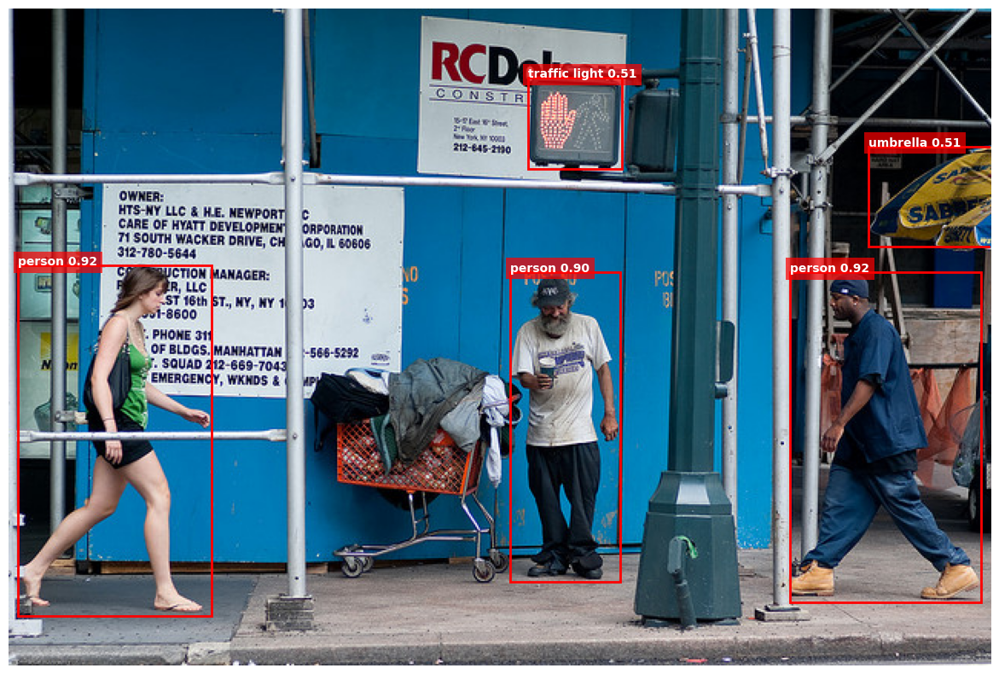



Detecting objects in data/000000002153.jpg

0: 480x640 5 persons, 1 baseball bat, 368.4ms
Speed: 2.0ms preprocess, 368.4ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)


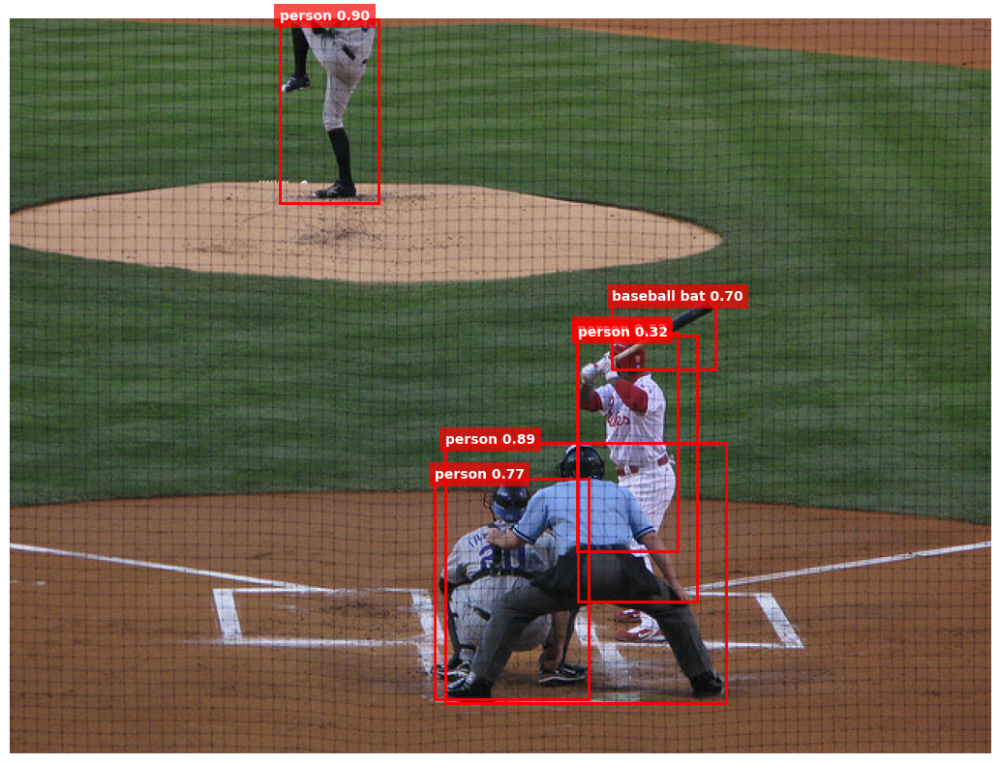



Detecting objects in data/000000037777.jpg

0: 448x640 1 bowl, 1 apple, 2 chairs, 1 dining table, 1 oven, 2 refrigerators, 341.6ms
Speed: 2.6ms preprocess, 341.6ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)


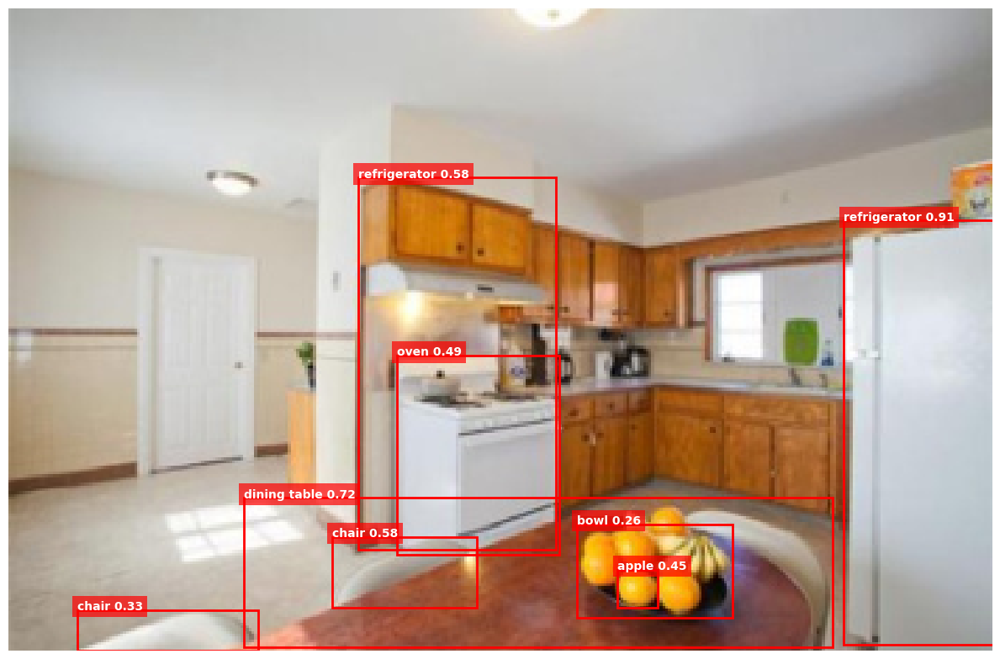



Detecting objects in data/000000039769.jpg

0: 480x640 2 cats, 1 dog, 1 couch, 2 remotes, 366.6ms
Speed: 2.0ms preprocess, 366.6ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)


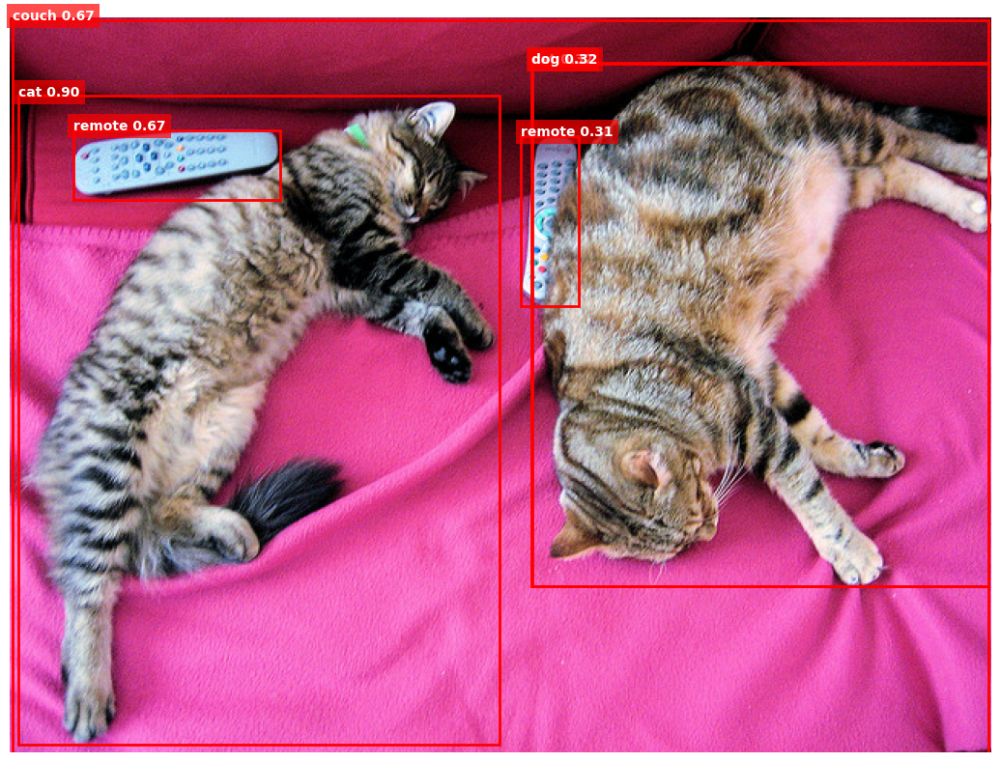



Detecting objects in data/000000001675.jpg

0: 480x640 1 cat, 1 laptop, 369.7ms
Speed: 1.9ms preprocess, 369.7ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


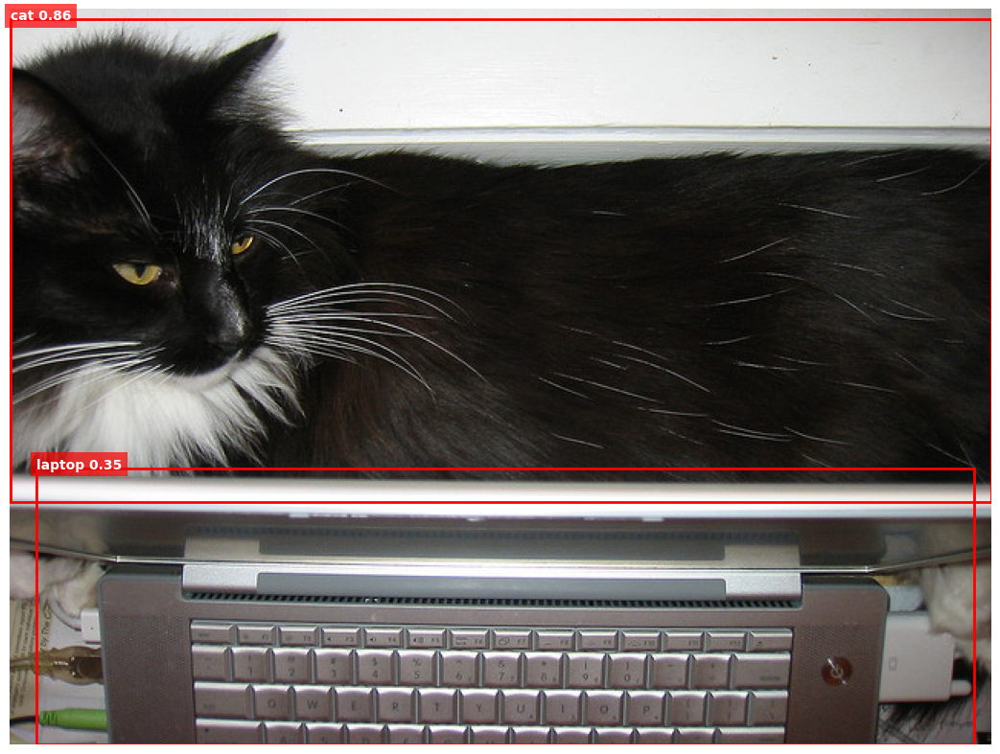



Detecting objects in data/000000002149.jpg

0: 448x640 4 apples, 337.8ms
Speed: 1.7ms preprocess, 337.8ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)


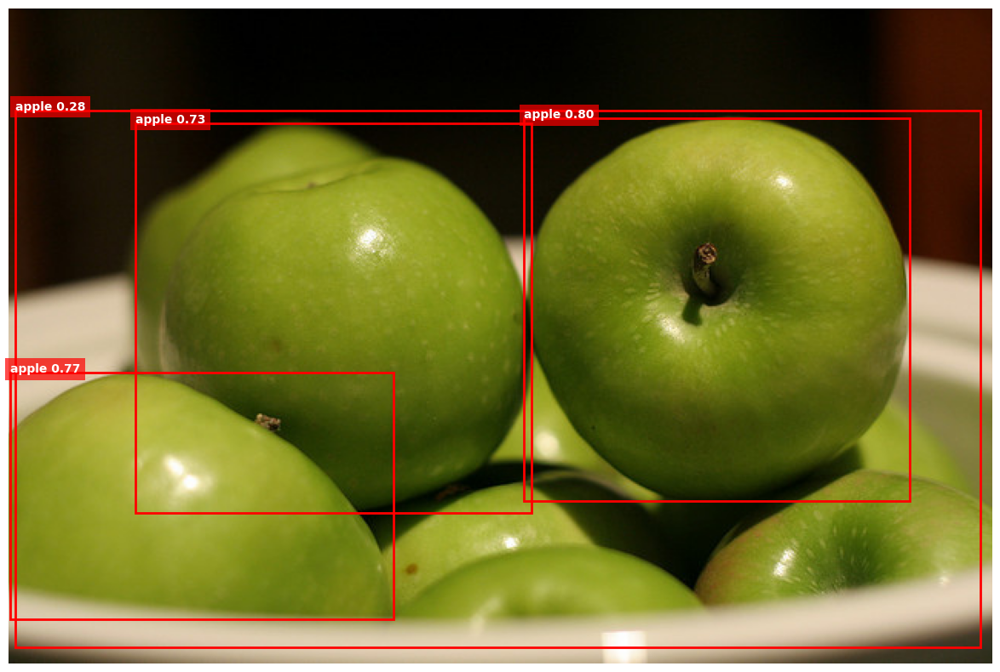

In [23]:
for path in image_paths:
    print(f"Detecting objects in {path}")
    detect_objects(path)
    print("\n")

## Conclusion

In this notebook, we've implemented object detection using the YOLO (You Only Look Once) algorithm. We used a pre-trained YOLOv5 model to detect objects in randomly selected images from the COCO dataset. The process includes:

1. Downloading random images from the COCO dataset
2. Loading a pre-trained YOLOv5 model
3. Performing object detection on the downloaded images
4. Visualizing the results with bounding boxes and labels

This implementation demonstrates how to use a pre-trained YOLO model for object detection on a variety of images, showcasing its versatility in detecting different types of objects in various scenarios.